# Window Segmentation from Waste Dataset

**Goal:** Train a pretrained segmentation model to predict the "window" — the region of each image that contains all waste annotations.

## Plan
1. **Setup & Imports** — install missing deps (torch, torchvision), import libraries
2. **Load Dataset** — read `waste_v3.csv`, group RLE masks by image
3. **Generate Window Ground Truth** — union all masks per image → convex hull = "window" mask
4. **Visualize** — overlay window masks on sample images
5. **PyTorch Dataset & DataLoader** — image + window mask pairs, with augmentations
6. **Model** — pretrained DeepLabV3-ResNet50 (binary segmentation head)
7. **Training** — BCE + Dice loss, train/val split
8. **Evaluation** — IoU, visualize predictions

## 1. Setup & Imports
Install torch + torchvision if needed, then import everything.

In [1]:
import sys
sys.path.append(".")

import numpy as np
import pandas as pd
import cv2
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt

from utils import get_mask_coordinates

DATASET_ROOT = Path("/mnt/gluster/datasets/NES/waste_v1")
CSV_PATH = DATASET_ROOT / "waste_v1.csv"

print("Ready")

Ready


## 2. Load Dataset
Load the CSV. Each row is one annotation (RLE mask) for an image. Multiple rows per image.

In [2]:
df = pd.read_csv(CSV_PATH)
print(f"Total annotations: {len(df)}")
print(f"Unique images: {df['image'].nunique()}")
print(f"Labels: {df['label'].unique()}")
df.head()

Total annotations: 770
Unique images: 186
Labels: ['Kunststoff' 'Filterkerzenbruch' 'Beton' 'Leerraum' 'Schotter/Sand'
 'Feuerfest Zement' 'Schamott' 'Keramik' 'Metall Eisen' 'Glas' 'Kabel'
 'Mineralwolle' 'Filter' 'Aluminium' 'Metall' 'Bauschutt'
 'Kunststoff (nicht verbrennbar, z.B. PVC)' 'Erde' 'Schlamm'
 'Biologischer Abfall' 'Asche' 'Kalk' 'Unbekannt']


,dataset,image,mask,area,split,label
0,waste_v1,/mnt/gluster/datasets/NES/waste_v1/images/EB52...,"[694, 210, 1379, 210, 1379, 210, 1379, 210, 13...",1748297,train,Kunststoff
1,waste_v1,/mnt/gluster/datasets/NES/waste_v1/images/EB60...,"[121, 120, 1791, 120, 1791, 120, 1791, 120, 17...",3496581,train,Filterkerzenbruch
2,waste_v1,/mnt/gluster/datasets/NES/waste_v1/images/EB55...,"[1112, 49, 97, 24, 56, 145, 25, 217, 1298, 49,...",2602606,train,Beton
3,waste_v1,/mnt/gluster/datasets/NES/waste_v1/images/EB55...,"[97, 524, 48, 8, 32, 121, 25, 8, 24, 8, 1186, ...",3016707,train,Beton
4,waste_v1,/mnt/gluster/datasets/NES/waste_v1/images/EB55...,"[226, 40, 323, 40, 323, 40, 323, 40, 323, 40, ...",59266,train,Leerraum


## 3. Generate Window Ground Truth
For each image:
1. Decode all RLE masks → combine into a single union mask
2. Fill any holes inside the union mask
3. Result is the binary "window" ground-truth mask

In [3]:
import ast

def build_window_mask(image_path: str, group: pd.DataFrame) -> np.ndarray:
    """
    Given all annotation rows for one image, decode RLE masks,
    union them, and fill any interior holes to get the 'window' mask.
    Applies morphological closing to seal cracks/gaps before hole-filling.
    """
    img = Image.open(image_path)
    h, w = img.height, img.width
    union_mask = np.zeros((h, w), dtype=np.uint8)

    for _, row in group.iterrows():
        rle_list = ast.literal_eval(row["mask"])
        y_coords, x_coords = get_mask_coordinates(rle_list)
        # clip to image bounds
        valid = (y_coords >= 0) & (y_coords < h) & (x_coords >= 0) & (x_coords < w)
        union_mask[y_coords[valid], x_coords[valid]] = 1

    # Morphological closing to seal cracks and small gaps
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15, 15))
    closed_mask = cv2.morphologyEx(union_mask, cv2.MORPH_CLOSE, kernel)

    # fill holes: flood-fill background from (0,0), then invert
    flood = closed_mask.copy()
    h_pad, w_pad = h + 2, w + 2
    flood_mask = np.zeros((h_pad, w_pad), dtype=np.uint8)
    cv2.floodFill(flood, flood_mask, (0, 0), 1)
    window_mask = closed_mask | (1 - flood)
    return window_mask


# Group by image and build window masks
grouped = df.groupby("image")
print(f"Building window masks for {len(grouped)} images...")

window_data = []  # list of (image_path, window_mask)
for image_path, group in grouped:
    mask = build_window_mask(image_path, group)
    window_data.append((image_path, mask))

print(f"Done. {len(window_data)} window masks generated.")

Building window masks for 186 images...
Done. 186 window masks generated.


In [4]:
# Check aspect ratios and fix rotated images/masks
aspect_ratios = []
for img_path, mask in window_data:
    img = Image.open(img_path)
    w, h = img.size
    aspect_ratios.append((img_path, w, h, w / h))

# Determine the dominant aspect ratio (majority vote on orientation)
landscape_count = sum(1 for _, w, h, _ in aspect_ratios if w >= h)
portrait_count = sum(1 for _, w, h, _ in aspect_ratios if w < h)
dominant_is_landscape = landscape_count >= portrait_count

print(f"Landscape images: {landscape_count}, Portrait images: {portrait_count}")
print(f"Dominant orientation: {'landscape' if dominant_is_landscape else 'portrait'}")

# Identify images that don't match the dominant orientation (likely rotated 90°)
rotated_indices = []
for i, (img_path, w, h, ar) in enumerate(aspect_ratios):
    is_landscape = w >= h
    if is_landscape != dominant_is_landscape:
        rotated_indices.append(i)

print(f"\nImages with mismatched orientation (likely rotated ±90°): {len(rotated_indices)}")
for idx in rotated_indices[:10]:
    img_path, w, h, ar = aspect_ratios[idx]
    print(f"  {Path(img_path).name}: {w}x{h} (AR={ar:.3f})")

# Fix: rotate mismatched images and their masks to match dominant orientation
for idx in rotated_indices:
    img_path, mask = window_data[idx]
    # Rotate mask 90° clockwise to match dominant orientation
    mask_rotated = np.rot90(mask, k=-1)  # k=-1 is 90° clockwise
    window_data[idx] = (img_path, mask_rotated)

if rotated_indices:
    print(f"\nRotated {len(rotated_indices)} masks by 90° to match dominant orientation.")
else:
    print("\nAll images have consistent orientation. No rotation needed.")

Landscape images: 4, Portrait images: 182
Dominant orientation: portrait

Images with mismatched orientation (likely rotated ±90°): 4
  EB5529-1.png: 4032x3024 (AR=1.333)
  EB5919-1.png: 4032x3024 (AR=1.333)
  EB5975-1.png: 4032x3024 (AR=1.333)
  EB5977-1.png: 4032x3024 (AR=1.333)

Rotated 4 masks by 90° to match dominant orientation.


## 3b. QA — Review & Remove Bad Samples
Save all images with GT overlay to a folder. Delete the bad ones manually, then run the next cell to filter them out.

In [5]:
# After manual QA: filter window_data to only keep images still in the QA folder
QA_DIR = DATASET_ROOT / "qa_window_masks"
remaining_files = {f.stem for f in QA_DIR.glob("*.jpg")}
before_count = len(window_data)

window_data = [(img_path, mask) for img_path, mask in window_data
               if Path(img_path).stem in remaining_files]

after_count = len(window_data)
removed = before_count - after_count
print(f"Before QA: {before_count} images")
print(f"After QA:  {after_count} images")
print(f"Removed:   {removed} bad samples")

Before QA: 186 images
After QA:  147 images
Removed:   39 bad samples


## 4. Visualize Window Masks
Show a few examples of images with their window ground truth overlaid.

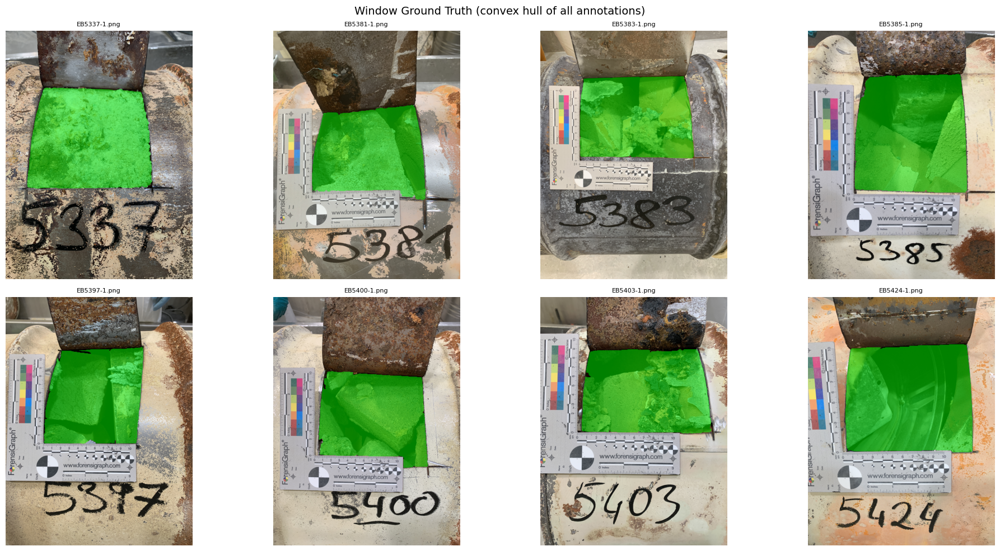

In [6]:
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
for ax, (img_path, mask) in zip(axes.flat, window_data[0:8]):
    img = np.array(Image.open(img_path))
    # overlay mask as semi-transparent green
    overlay = img.copy()
    overlay[mask == 1] = (overlay[mask == 1] * 0.5 + np.array([0, 255, 0]) * 0.5).astype(np.uint8)
    ax.imshow(overlay)
    ax.set_title(Path(img_path).name, fontsize=8)
    ax.axis("off")
plt.suptitle("Window Ground Truth (convex hull of all annotations)", fontsize=14)
plt.tight_layout()
plt.show()

## 5. PyTorch Dataset & DataLoader
Custom Dataset that loads an image + window mask, resizes to 512×512, and applies augmentations.

In [7]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision.transforms.v2 as T
import torchvision.transforms.v2.functional as TF

IMG_SIZE = 512

class WindowSegDataset(Dataset):
    def __init__(self, window_data: list, img_size: int = IMG_SIZE, augment: bool = False):
        self.data = window_data
        self.img_size = img_size
        self.augment = augment

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_path, mask = self.data[idx]
        img = Image.open(img_path).convert("RGB")

        # resize
        img = TF.resize(img, [self.img_size, self.img_size])
        mask = cv2.resize(mask, (self.img_size, self.img_size), interpolation=cv2.INTER_NEAREST)

        # to tensor
        img = TF.to_image(img)
        img = TF.to_dtype(img, torch.float32, scale=True)
        mask = torch.from_numpy(mask).long()

        if self.augment:
            # Random horizontal flip
            if torch.rand(1) > 0.5:
                img = TF.horizontal_flip(img)
                mask = TF.horizontal_flip(mask.unsqueeze(0)).squeeze(0)

            # Random 90° rotation (0°, 90°, 180°, 270°)
            k = torch.randint(0, 4, (1,)).item()
            if k > 0:
                img = TF.rotate(img, angle=90 * k)
                mask = TF.rotate(mask.unsqueeze(0), angle=90 * k).squeeze(0)

        return img, mask


# Train/val split (80/20)
n_val = max(1, int(0.2 * len(window_data)))
n_train = len(window_data) - n_val

train_data, val_data = random_split(window_data, [n_train, n_val],
                                     generator=torch.Generator().manual_seed(42))

train_ds = WindowSegDataset(list(train_data), augment=True)
val_ds = WindowSegDataset(list(val_data), augment=False)

train_loader = DataLoader(train_ds, batch_size=4, shuffle=True, num_workers=2, pin_memory=True, drop_last=True)
val_loader = DataLoader(val_ds, batch_size=4, shuffle=False, num_workers=2, pin_memory=True)

print(f"Train: {len(train_ds)}, Val: {len(val_ds)}")

# Sanity check
img, mask = train_ds[0]
print(f"Image shape: {img.shape}, Mask shape: {mask.shape}, Mask unique: {mask.unique()}")

Train: 118, Val: 29
Image shape: torch.Size([3, 512, 512]), Mask shape: torch.Size([512, 512]), Mask unique: tensor([0, 1])


## 6. Model — DeepLabV3 (ResNet50)
Use torchvision's pretrained DeepLabV3 with a ResNet-50 backbone. Replace the classification head with 2 classes (background + window).

In [8]:
from torchvision.models.segmentation import deeplabv3_resnet50

NUM_CLASSES = 2  # background + window

model = deeplabv3_resnet50(weights="DEFAULT")
# Replace classifier head for binary segmentation
model.classifier[4] = nn.Conv2d(256, NUM_CLASSES, kernel_size=1)
model.aux_classifier[4] = nn.Conv2d(256, NUM_CLASSES, kernel_size=1)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
print(f"Device: {device}")

Device: cuda


## 7. Training
BCE + Dice loss for better segmentation performance. Train for ~30 epochs.

In [9]:
def dice_loss(pred: torch.Tensor, target: torch.Tensor, smooth: float = 1.0) -> torch.Tensor:
    """Dice loss for binary segmentation. pred: (B, H, W) probabilities, target: (B, H, W) binary."""
    pred_flat = pred.reshape(-1)
    target_flat = target.reshape(-1).float()
    intersection = (pred_flat * target_flat).sum()
    return 1 - (2. * intersection + smooth) / (pred_flat.sum() + target_flat.sum() + smooth)


def compute_iou(pred: torch.Tensor, target: torch.Tensor) -> float:
    """IoU for binary masks. pred/target: (B, H, W) binary."""
    intersection = ((pred == 1) & (target == 1)).sum().float()
    union = ((pred == 1) | (target == 1)).sum().float()
    return (intersection / (union + 1e-6)).item()


NUM_EPOCHS = 25
LR = 1e-4

ce_loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-4)
# Drop LR by 10x at epoch 15 (coarse→fine) and again at epoch 22 (final refinement)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[15, 22], gamma=0.1)

best_val_iou = 0.0
history = {"train_loss": [], "val_loss": [], "val_iou": [], "lr": []}

for epoch in range(NUM_EPOCHS):
    # --- Train ---
    model.train()
    epoch_loss = 0.0
    for images, masks in train_loader:
        images, masks = images.to(device), masks.to(device)

        out = model(images)["out"]  # (B, 2, H, W)
        ce = ce_loss_fn(out, masks)
        probs = torch.softmax(out, dim=1)[:, 1]  # window probability
        dl = dice_loss(probs, masks)
        loss = ce + dl

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()

    epoch_loss /= len(train_loader)
    current_lr = scheduler.get_last_lr()[0]
    scheduler.step()

    # --- Validate ---
    model.eval()
    val_loss_total = 0.0
    val_iou_total = 0.0
    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.to(device), masks.to(device)
            out = model(images)["out"]
            ce = ce_loss_fn(out, masks)
            probs = torch.softmax(out, dim=1)[:, 1]
            dl = dice_loss(probs, masks)
            val_loss_total += (ce + dl).item()

            preds = out.argmax(dim=1)
            val_iou_total += compute_iou(preds, masks)

    val_loss = val_loss_total / len(val_loader)
    val_iou = val_iou_total / len(val_loader)

    history["train_loss"].append(epoch_loss)
    history["val_loss"].append(val_loss)
    history["val_iou"].append(val_iou)
    history["lr"].append(current_lr)

    # Save best
    if val_iou > best_val_iou:
        best_val_iou = val_iou
        torch.save(model.state_dict(), DATASET_ROOT / "window_seg_best.pth")

    print(f"Epoch {epoch+1:02d}/{NUM_EPOCHS} | LR: {current_lr:.2e} | Train Loss: {epoch_loss:.4f} | Val Loss: {val_loss:.4f} | Val IoU: {val_iou:.4f}")

print(f"\nBest Val IoU: {best_val_iou:.4f}")

Epoch 01/25 | LR: 1.00e-04 | Train Loss: 0.8190 | Val Loss: 0.4648 | Val IoU: 0.8171
Epoch 02/25 | LR: 1.00e-04 | Train Loss: 0.3377 | Val Loss: 0.2719 | Val IoU: 0.9093
Epoch 03/25 | LR: 1.00e-04 | Train Loss: 0.2423 | Val Loss: 0.2161 | Val IoU: 0.9258
Epoch 04/25 | LR: 1.00e-04 | Train Loss: 0.2027 | Val Loss: 0.2208 | Val IoU: 0.9153
Epoch 05/25 | LR: 1.00e-04 | Train Loss: 0.1804 | Val Loss: 0.2037 | Val IoU: 0.9080
Epoch 06/25 | LR: 1.00e-04 | Train Loss: 0.1478 | Val Loss: 0.1481 | Val IoU: 0.9438
Epoch 07/25 | LR: 1.00e-04 | Train Loss: 0.1256 | Val Loss: 0.1744 | Val IoU: 0.9075
Epoch 08/25 | LR: 1.00e-04 | Train Loss: 0.1188 | Val Loss: 0.1030 | Val IoU: 0.9634
Epoch 09/25 | LR: 1.00e-04 | Train Loss: 0.1099 | Val Loss: 0.1866 | Val IoU: 0.9048
Epoch 10/25 | LR: 1.00e-04 | Train Loss: 0.0932 | Val Loss: 0.1440 | Val IoU: 0.9209
Epoch 11/25 | LR: 1.00e-04 | Train Loss: 0.0906 | Val Loss: 0.2210 | Val IoU: 0.8685
Epoch 12/25 | LR: 1.00e-04 | Train Loss: 0.0835 | Val Loss: 0.141

## 8. Evaluation
Plot training curves and visualize predictions on validation set.

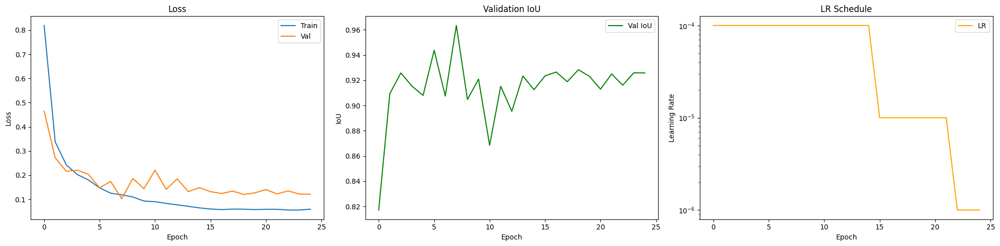

In [10]:
# Training curves
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 5))
ax1.plot(history["train_loss"], label="Train")
ax1.plot(history["val_loss"], label="Val")
ax1.set_xlabel("Epoch"); ax1.set_ylabel("Loss"); ax1.legend(); ax1.set_title("Loss")
ax2.plot(history["val_iou"], label="Val IoU", color="green")
ax2.set_xlabel("Epoch"); ax2.set_ylabel("IoU"); ax2.legend(); ax2.set_title("Validation IoU")
ax3.plot(history["lr"], label="LR", color="orange")
ax3.set_xlabel("Epoch"); ax3.set_ylabel("Learning Rate"); ax3.legend(); ax3.set_title("LR Schedule")
ax3.set_yscale("log")
plt.tight_layout(); plt.show()

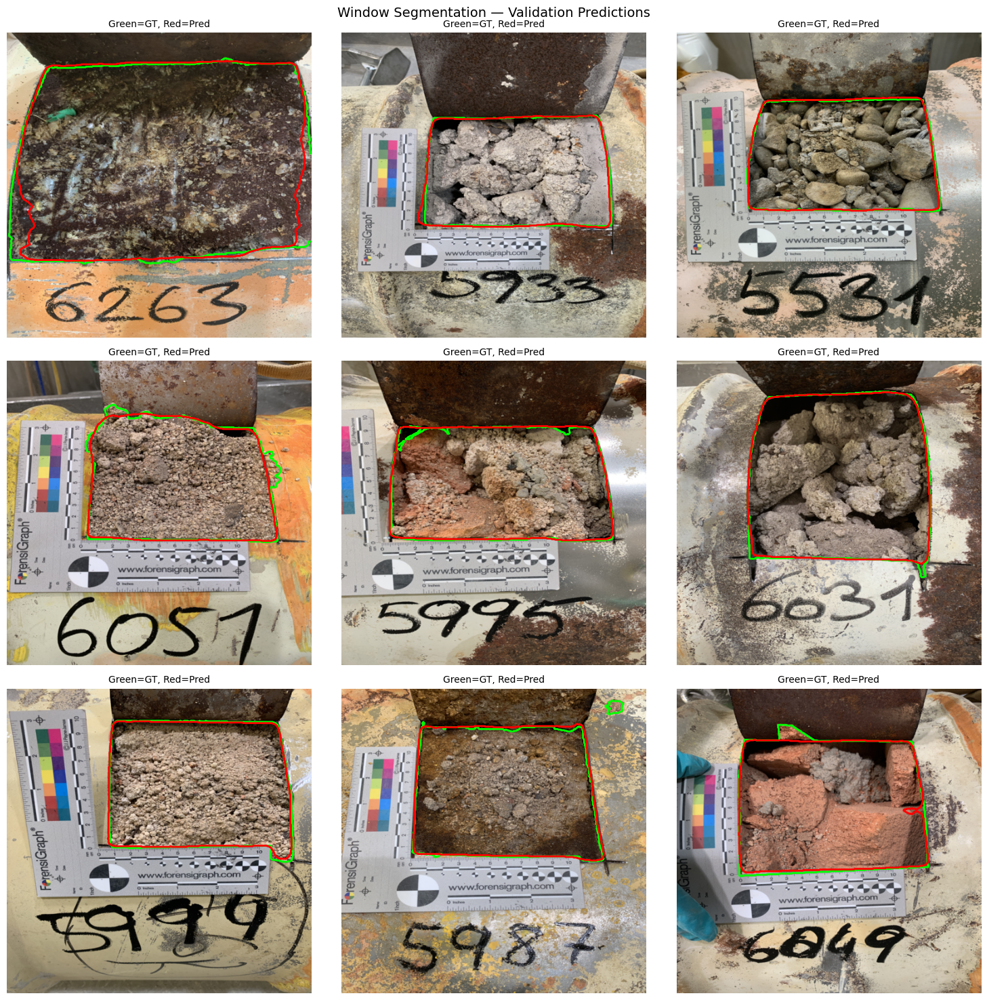

In [11]:
# Visualize predictions on validation samples
model.load_state_dict(torch.load(DATASET_ROOT / "window_seg_best.pth", map_location=device, weights_only=True))
model.eval()

fig, axes = plt.subplots(3, 3, figsize=(15, 15))
axes_flat = axes.flat

for i, (img_t, mask_t) in enumerate(val_ds):
    if i >= 9:
        break
    with torch.no_grad():
        pred = model(img_t.unsqueeze(0).to(device))["out"]
        pred_mask = pred.argmax(dim=1).squeeze().cpu().numpy()

    # Denormalize image for display
    img_np = img_t.permute(1, 2, 0).numpy()

    ax = axes_flat[i]
    ax.imshow(img_np)
    ax.contour(mask_t.numpy(), colors="lime", linewidths=2, levels=[0.5])     # GT
    ax.contour(pred_mask, colors="red", linewidths=2, levels=[0.5])           # Pred
    ax.set_title(f"Green=GT, Red=Pred", fontsize=10)
    ax.axis("off")

plt.suptitle("Window Segmentation — Validation Predictions", fontsize=14)
plt.tight_layout()
plt.show()

## 9. Post-Segmentation Classification (Largest Annotation Label)
Keep window segmentation binary and unchanged. Train a separate classifier on the segmented area.

Label target per image: take the label of the **largest annotated object** in that image.

In [14]:
from torchvision.models import resnet18, ResNet18_Weights

def largest_label_from_group(image_path: str, group: pd.DataFrame):
    """Return label of the largest annotation (by decoded pixel area) for one image."""
    img = Image.open(image_path)
    h, w = img.height, img.width

    best_label = None
    best_area = -1

    for _, row in group.iterrows():
        rle_list = ast.literal_eval(row["mask"])
        y_coords, x_coords = get_mask_coordinates(rle_list)
        valid = (y_coords >= 0) & (y_coords < h) & (x_coords >= 0) & (x_coords < w)
        area = int(valid.sum())
        if area > best_area:
            best_area = area
            best_label = row["label"]

    return best_label, best_area

# Build per-image class target from largest annotation
largest_label_map = {}
for image_path, group in df.groupby("image"):
    try:
        label, area = largest_label_from_group(image_path, group)
    except FileNotFoundError:
        continue
    if label is not None and area > 0:
        largest_label_map[image_path] = label

# Keep only samples that survived QA and have a class target
cls_samples = []  # (image_path, window_mask, class_label)
for img_path, win_mask in window_data:
    if img_path in largest_label_map:
        cls_samples.append((img_path, win_mask, largest_label_map[img_path]))

classes = sorted({label for _, _, label in cls_samples})
label_to_idx = {label: idx for idx, label in enumerate(classes)}
idx_to_label = {idx: label for label, idx in label_to_idx.items()}

print(f"Classifier samples: {len(cls_samples)}")
print(f"Num classes: {len(classes)}")
print(f"Classes: {classes}")

def align_image_and_mask(image_np: np.ndarray, mask_np: np.ndarray) -> tuple[np.ndarray, np.ndarray]:
    """Rotate the image when needed so it matches the stored mask orientation."""
    if image_np.shape[:2] == mask_np.shape:
        return image_np, mask_np

    if image_np.shape[0] == mask_np.shape[1] and image_np.shape[1] == mask_np.shape[0]:
        rotated_ccw = np.rot90(image_np, k=1)
        if rotated_ccw.shape[:2] == mask_np.shape:
            return rotated_ccw, mask_np

        rotated_cw = np.rot90(image_np, k=-1)
        if rotated_cw.shape[:2] == mask_np.shape:
            return rotated_cw, mask_np

    raise ValueError(
        f"Image/mask shape mismatch: image={image_np.shape[:2]}, mask={mask_np.shape}"
    )

def crop_and_mask_from_window(image_np: np.ndarray, window_mask: np.ndarray) -> np.ndarray:
    """Crop to window bbox and black out everything outside the mask."""
    image_np, window_mask = align_image_and_mask(image_np, window_mask)
    ys, xs = np.where(window_mask > 0)
    if len(ys) == 0 or len(xs) == 0:
        return image_np

    y1, y2 = ys.min(), ys.max()
    x1, x2 = xs.min(), xs.max()

    crop = image_np[y1:y2 + 1, x1:x2 + 1].copy()
    crop_mask = window_mask[y1:y2 + 1, x1:x2 + 1]
    crop[crop_mask == 0] = 0
    return crop

class WindowClassDataset(Dataset):
    def __init__(self, samples: list, preprocess, augment: bool = False):
        self.samples = samples
        self.preprocess = preprocess
        self.augment = augment

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, win_mask, label = self.samples[idx]
        img = np.array(Image.open(img_path).convert("RGB"))
        img, win_mask = align_image_and_mask(img, win_mask)

        roi = crop_and_mask_from_window(img, win_mask)

        if self.augment and torch.rand(1).item() > 0.5:
            roi = np.ascontiguousarray(np.fliplr(roi))

        roi_pil = Image.fromarray(roi)
        img_t = self.preprocess(roi_pil)
        y = label_to_idx[label]
        return img_t, y

Classifier samples: 147
Num classes: 15
Classes: ['Aluminium', 'Bauschutt', 'Beton', 'Erde', 'Feuerfest Zement', 'Filterkerzenbruch', 'Glas', 'Kalk', 'Keramik', 'Metall', 'Metall Eisen', 'Mineralwolle', 'Schamott', 'Schlamm', 'Schotter/Sand']


## 10. Train Classifier on Segmented Window Area
Train a separate image classifier (ResNet18) on the segmented window ROI.

This does **not** change your segmenter; it only adds a label guess after segmentation.

[CLS] Epoch 01/12 | Train Loss: 2.1075 | Val Loss: 1.9490 | Val Acc: 0.4483
[CLS] Epoch 02/12 | Train Loss: 0.9050 | Val Loss: 1.5636 | Val Acc: 0.5172
[CLS] Epoch 03/12 | Train Loss: 0.6262 | Val Loss: 1.4401 | Val Acc: 0.5862
[CLS] Epoch 04/12 | Train Loss: 0.4130 | Val Loss: 1.3823 | Val Acc: 0.6552
[CLS] Epoch 05/12 | Train Loss: 0.2608 | Val Loss: 1.4353 | Val Acc: 0.6207
[CLS] Epoch 06/12 | Train Loss: 0.1299 | Val Loss: 1.4684 | Val Acc: 0.6207
[CLS] Epoch 07/12 | Train Loss: 0.1167 | Val Loss: 1.4503 | Val Acc: 0.6552
[CLS] Epoch 08/12 | Train Loss: 0.1325 | Val Loss: 1.4249 | Val Acc: 0.6897
[CLS] Epoch 09/12 | Train Loss: 0.0888 | Val Loss: 1.3891 | Val Acc: 0.6552
[CLS] Epoch 10/12 | Train Loss: 0.0635 | Val Loss: 1.3412 | Val Acc: 0.6552
[CLS] Epoch 11/12 | Train Loss: 0.0370 | Val Loss: 1.3398 | Val Acc: 0.6552
[CLS] Epoch 12/12 | Train Loss: 0.0827 | Val Loss: 1.3548 | Val Acc: 0.6552
Best classifier Val Acc: 0.6897


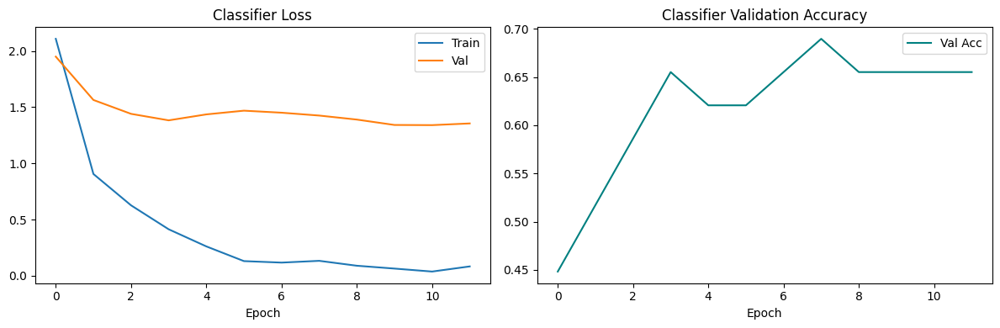

In [15]:
if len(cls_samples) < 2 or len(classes) < 2:
    print("Not enough data/classes to train classifier. Need at least 2 samples and 2 classes.")
else:
    cls_weights = ResNet18_Weights.DEFAULT
    cls_preprocess = cls_weights.transforms()

    n_val_cls = max(1, int(0.2 * len(cls_samples)))
    n_train_cls = len(cls_samples) - n_val_cls
    if n_train_cls < 1:
        n_train_cls = len(cls_samples) - 1
        n_val_cls = 1

    cls_train_subset, cls_val_subset = random_split(
        cls_samples, [n_train_cls, n_val_cls], generator=torch.Generator().manual_seed(42)
    )
    cls_train_samples = list(cls_train_subset)
    cls_val_samples = list(cls_val_subset)

    cls_train_ds = WindowClassDataset(cls_train_samples, preprocess=cls_preprocess, augment=True)
    cls_val_ds = WindowClassDataset(cls_val_samples, preprocess=cls_preprocess, augment=False)

    cls_train_loader = DataLoader(cls_train_ds, batch_size=16, shuffle=True, num_workers=2, pin_memory=True)
    cls_val_loader = DataLoader(cls_val_ds, batch_size=16, shuffle=False, num_workers=2, pin_memory=True)

    cls_model = resnet18(weights=cls_weights)
    cls_model.fc = nn.Linear(cls_model.fc.in_features, len(classes))
    cls_model = cls_model.to(device)

    cls_loss_fn = nn.CrossEntropyLoss()
    cls_optimizer = torch.optim.AdamW(cls_model.parameters(), lr=1e-4, weight_decay=1e-4)

    CLS_EPOCHS = 12
    cls_history = {"train_loss": [], "val_loss": [], "val_acc": []}
    best_val_acc = 0.0

    for epoch in range(CLS_EPOCHS):
        cls_model.train()
        train_loss_total = 0.0

        for images, targets in cls_train_loader:
            images = images.to(device)
            targets = targets.to(device)

            logits = cls_model(images)
            loss = cls_loss_fn(logits, targets)

            cls_optimizer.zero_grad()
            loss.backward()
            cls_optimizer.step()

            train_loss_total += loss.item()

        train_loss = train_loss_total / max(1, len(cls_train_loader))

        cls_model.eval()
        val_loss_total = 0.0
        correct = 0
        total = 0
        with torch.no_grad():
            for images, targets in cls_val_loader:
                images = images.to(device)
                targets = targets.to(device)

                logits = cls_model(images)
                loss = cls_loss_fn(logits, targets)
                val_loss_total += loss.item()

                preds = logits.argmax(dim=1)
                correct += (preds == targets).sum().item()
                total += targets.numel()

        val_loss = val_loss_total / max(1, len(cls_val_loader))
        val_acc = correct / max(1, total)

        cls_history["train_loss"].append(train_loss)
        cls_history["val_loss"].append(val_loss)
        cls_history["val_acc"].append(val_acc)

        if val_acc > best_val_acc:
            best_val_acc = val_acc
            torch.save(
                {
                    "state_dict": cls_model.state_dict(),
                    "classes": classes
                },
                DATASET_ROOT / "window_cls_best.pth"
            )

        print(
            f"[CLS] Epoch {epoch+1:02d}/{CLS_EPOCHS} | "
            f"Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}"
        )

    print(f"Best classifier Val Acc: {best_val_acc:.4f}")

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(cls_history["train_loss"], label="Train")
    ax1.plot(cls_history["val_loss"], label="Val")
    ax1.set_title("Classifier Loss")
    ax1.set_xlabel("Epoch")
    ax1.legend()

    ax2.plot(cls_history["val_acc"], label="Val Acc", color="teal")
    ax2.set_title("Classifier Validation Accuracy")
    ax2.set_xlabel("Epoch")
    ax2.legend()

    plt.tight_layout()
    plt.show()

Using image: /mnt/bigDisk/home/picklr/nes/EB5344.JPG


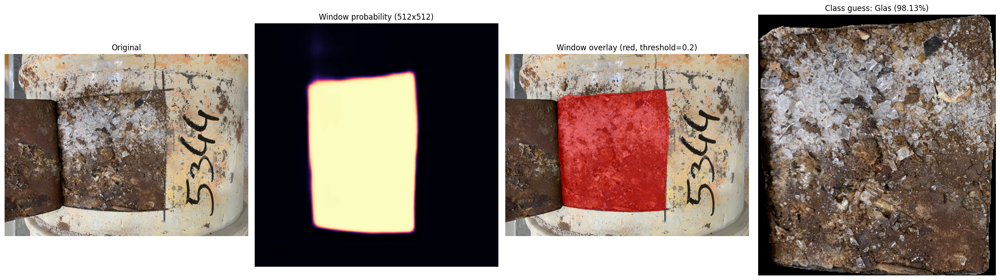

In [ ]:
# Inference + visualization for an external image (segmentation + optional class guess)
img_path = Path("/mnt/bigDisk/home/picklr/nes/EB5344.JPG")
if not img_path.exists():
    raise FileNotFoundError(f"Image not found: {img_path}")
print(f"Using image: {img_path}")

# Load best segmentation checkpoint (if available)
seg_ckpt_path = DATASET_ROOT / "window_seg_best.pth"
if seg_ckpt_path.exists():
    try:
        model.load_state_dict(torch.load(seg_ckpt_path, map_location=device, weights_only=True))
    except TypeError:
        model.load_state_dict(torch.load(seg_ckpt_path, map_location=device))
model.eval()

# Read original image
img_pil = Image.open(img_path).convert("RGB")
img_np = np.array(img_pil)
h0, w0 = img_np.shape[:2]

# --- Segmentation ---
img_resized = TF.resize(img_pil, [IMG_SIZE, IMG_SIZE])
img_t = TF.to_image(img_resized)
img_t = TF.to_dtype(img_t, torch.float32, scale=True)

with torch.no_grad():
    out = model(img_t.unsqueeze(0).to(device))["out"]
    prob = torch.softmax(out, dim=1)[0, 1].cpu().numpy()

thr = 0.2
pred_mask = (prob > thr).astype(np.uint8)
pred_mask_orig = cv2.resize(pred_mask, (w0, h0), interpolation=cv2.INTER_NEAREST)

overlay = img_np.copy()
overlay[pred_mask_orig == 1] = (
    overlay[pred_mask_orig == 1] * 0.5 + np.array([255, 0, 0]) * 0.5
).astype(np.uint8)

# --- Classification on segmented area ---
pred_label = "leerraum"
pred_conf = 0.0
roi_for_vis = crop_and_mask_from_window(img_np, pred_mask_orig)
cls_ckpt_path = DATASET_ROOT / "window_cls_best.pth"

if cls_ckpt_path.exists():
    ckpt = torch.load(cls_ckpt_path, map_location=device)
    ckpt_classes = ckpt.get("classes", classes if "classes" in globals() else None)

    if ckpt_classes is not None and len(ckpt_classes) > 0:
        cls_weights = ResNet18_Weights.DEFAULT
        cls_preprocess = cls_weights.transforms()

        cls_model = resnet18(weights=cls_weights)
        cls_model.fc = nn.Linear(cls_model.fc.in_features, len(ckpt_classes))
        cls_model.load_state_dict(ckpt["state_dict"])
        cls_model = cls_model.to(device)
        cls_model.eval()

        roi_pil = Image.fromarray(roi_for_vis)
        cls_input = cls_preprocess(roi_pil).unsqueeze(0).to(device)

        with torch.no_grad():
            cls_logits = cls_model(cls_input)
            cls_probs = torch.softmax(cls_logits, dim=1)[0].cpu().numpy()

        pred_idx = int(np.argmax(cls_probs))
        pred_label = str(ckpt_classes[pred_idx])
        pred_conf = float(cls_probs[pred_idx])
    else:
        print("Classifier checkpoint found but class list is missing.")
else:
    print("No classifier checkpoint found. Run classifier training cell first.")

# Visualize
fig, axes = plt.subplots(1, 4, figsize=(22, 6))

axes[0].imshow(img_np)
axes[0].set_title("Original")
axes[0].axis("off")

axes[1].imshow(prob, cmap="magma")
axes[1].set_title("Window probability (512x512)")
axes[1].axis("off")

axes[2].imshow(overlay)
axes[2].set_title(f"Window overlay (red, threshold={thr})")
axes[2].axis("off")

axes[3].imshow(roi_for_vis)
axes[3].set_title(f"Class guess: {pred_label} ({pred_conf:.2%})")
axes[3].axis("off")

plt.tight_layout()
plt.show()